<a href="https://colab.research.google.com/github/GojouSatoru101/Dog-Breed-Classification/blob/main/dog_breed_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-class Dog Breed Classification
This notebook builds a multi-class image classifier using Tensorflow 2.x and Tensorflow Hub
## 1. Problem
Identifying dog breed of a given image
## 1. Data: From Kaggle's dog breed classification competition
https://www.kaggle.com/c/dog-breed-identification/data

## 2. Evaluation
Evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Features
* unstructured data
* 120 different classes
* 10,000+ images in training set
* 10,000+ images in test set

In [ ]:
import pandas as pd

In [ ]:
import numpy as np

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
# !unzip "drive/My Drive/Udemy_deep_learning/dog-breed-identification.zip" -d "drive/My Drive/Udemy_deep_learning/"

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
print("TF version:",tf.__version__)
print("TF hub version:",hub.__version__)

# Check for gpu availability
print("GPU available" if tf.test.is_gpu_available() else "GPU Not available")

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


TF version: 2.14.0
TF hub version: 0.15.0
GPU available


## Getting our data ready (turning images into tensors)

In [ ]:
labels_csv = pd.read_csv("/content/drive/MyDrive/Udemy_deep_learning/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

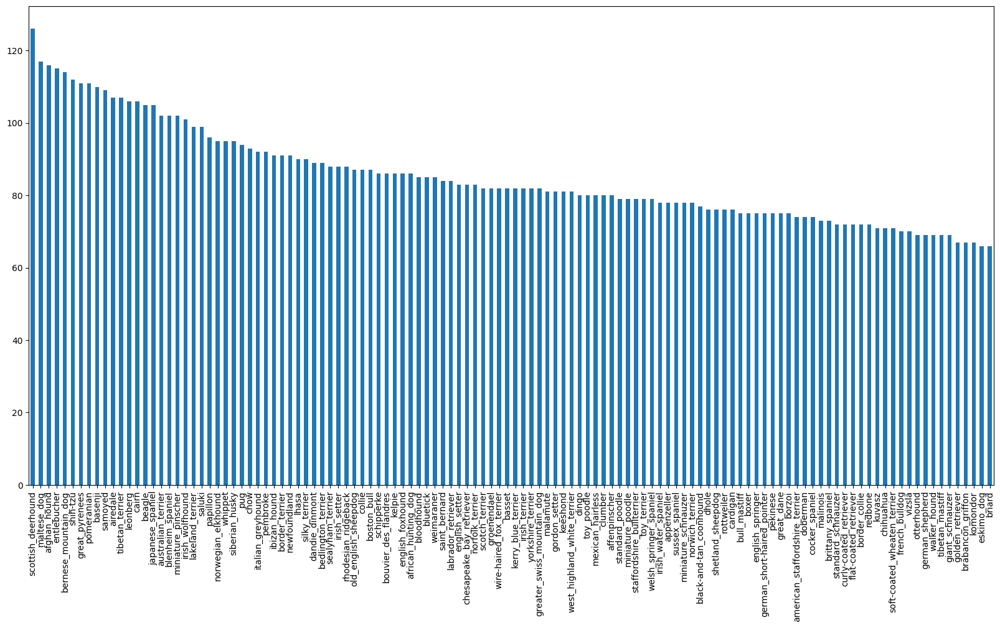

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

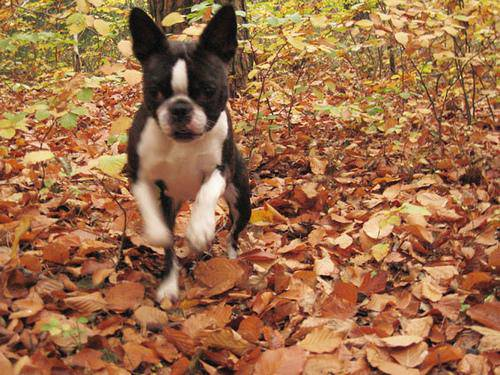

In [ ]:
# View image
from IPython.display import Image
Image("/content/drive/MyDrive/Udemy_deep_learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
# Get file paths
filename = ["drive/MyDrive/Udemy_deep_learning/train/"+i for i in labels_csv["id"]+".jpg"]
filename[:10]

['drive/MyDrive/Udemy_deep_learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Udemy_deep_learning/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Udemy_deep_learning/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Udemy_deep_learning/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Udemy_deep_learning/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Udemy_deep_learning/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Udemy_deep_learning/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Udemy_deep_learning/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Udemy_deep_learning/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Udemy_deep_learning/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether length of filenames are equal to actual number of files
import os
if len((os.listdir("drive/My Drive/Udemy_deep_learning/train"))) == len(filename):
  print("Number of items match PROCEED")
else:
  print("Number of items do not match!")


Number of items match PROCEED


In [ ]:
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [ ]:
len(labels) == len(filename)

True

In [ ]:
len(labels)

10222

In [ ]:
unique_breeds = np.unique(labels)
unique_breeds[:10]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle'], dtype=object)

In [ ]:
unique_breeds.shape

(120,)

## To convert labels to numbers first convert them to booleans
Convert one label to boolean

In [ ]:
bool_val = labels[0]==unique_breeds
bool_val

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

Convert all labels to boolean

In [ ]:


bool_labels = [label == unique_breeds for label in labels]
bool_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(bool_labels)

10222

In [ ]:
np.asarray(bool_labels).shape

(10222, 120)

Convert boolean into integers

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
# print(np.where(labels[0] == unique_breeds))
print(bool_labels[0].argmax())
print(bool_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(np.where(unique_breeds == labels[2]))
print(bool_labels[2].argmax())
print(bool_labels[2].astype(int))

pekinese
(array([85]),)
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# bool_labels = [labels.astype(int) for labels in bool_labels]
# bool_labels[:3]

Creating validation set


In [ ]:
X = filename
y = bool_labels

First working on only 1000 images

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:100}

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(X[:NUM_IMAGES],
                                                     y[:NUM_IMAGES],
                                                     test_size=0.2,
                                                     random_state=42)
len(X_train), len(y_train), len(X_valid), len(y_valid)

(800, 800, 200, 200)

## Preprocessing Images (turning images to tensors)
We will make a function that:
1. Take image filepath as input
2. Use tensorflow to read the file and save it to a variable `image`
3. Turn our `image`(a jpg) into Tensors
4. Normalize our image(color channel from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before that, let's see what importing image looks like

In [ ]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2,:4]

<tf.Tensor: shape=(2, 4, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        [ 62, 110,  58]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        [ 68, 116,  68]]], dtype=uint8)>

1. Take image filepath as input
2. Use tensorflow to read the file and save it to a variable `image`
3. Turn our `image`(a jpg) into Tensors
4. Normalize our image(color channel from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
IMG_SIZE = 224
def process_image(img_path):
  # Read an image file
  image = tf.io.read_file(img_path)
  # Turn jpg image into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
tensor = tf.io.read_file(filename[42])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor = tf.image.decode_jpeg(tensor, channels=3)
tensor

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 88, 138,  87],
        [ 75, 125,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  84],
        [ 76, 134,  86],
        [ 75, 133,  85]],

       [[ 71, 120,  73],
        [ 65, 115,  66],
        [ 62, 112,  63],
        ...,
        [ 73, 131,  83],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 54, 105,  64],
        [ 56, 107,  66],
        [ 62, 113,  72],
        ...,
        [ 70, 127,  82],
        [ 71, 128,  83],
        [ 72, 129,  84]],

       ...,

       [[  2,  11,  10],
        [  4,  13,  10],
        [  6,  15,  12],
        ...,
        [119, 112,  66],
        [125, 119,  71],
        [121, 115,  67]],

       [[  0,   3,   7],
        [  0,   7,   9],
        [  2,   8,   4],
        ...,
        [104,  97,  51],
        [111, 104,  58],
        [109, 102,  56]],

       [[ 16,  18,  30],
        [ 14,  19,  23],
        [ 15,  20,  13],
        ...,
        [ 99,  92,  4

In [ ]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34509805, 0.5411765 , 0.34117648],
        [0.29411766, 0.4901961 , 0.2901961 ],
        [0.24705884, 0.43529415, 0.23137257],
        ...,
        [0.29803923, 0.5254902 , 0.32941177],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29411766, 0.52156866, 0.33333334]],

       [[0.2784314 , 0.47058827, 0.28627452],
        [0.25490198, 0.45098042, 0.25882354],
        [0.24313727, 0.43921572, 0.24705884],
        ...,
        [0.28627452, 0.5137255 , 0.3254902 ],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21176472, 0.41176474, 0.2509804 ],
        [0.21960786, 0.41960788, 0.25882354],
        [0.24313727, 0.4431373 , 0.28235295],
        ...,
        [0.27450982, 0.49803925, 0.32156864],
        [0.2784314 , 0.5019608 , 0.3254902 ],
        [0.28235295, 0.5058824 , 0.32941177]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

## Turning data into batches
* batch size : 32 (standard)
* data should be in the form of tensorflow tuples
* In our case: tensorflow tuple is in the form (image, label)

In [ ]:
# Create a function to return the tuple
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now, make a function to turn all of our data (x and y) into batches

In [ ]:
BATCH_SIZE = 32
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image(X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data
  Also accepts test data as input (no labels).
  '''
  # no labels for test data
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
    '''
    The .map() function in TensorFlow is a transformation that applies a given function to each element of a dataset
    new_dataset = original_dataset.map(mapping_function)
    '''
  # If data is validation set, no need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")

    # Turn filepaths and labels to Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor fucntion is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [ ]:
data = tf.data.Dataset.from_tensor_slices((tf.constant(X_train[:2]),
                                          tf.constant(y_train[:2])))
# print(data)
# dataset = tf.data.Dataset.from_tensor_slices([1, 2, 3])
for element in data:
  print(element)




(<tf.Tensor: shape=(), dtype=string, numpy=b'drive/MyDrive/Udemy_deep_learning/train/00bee065dcec471f26394855c5c2f3de.jpg'>, <tf.Tensor: shape=(120,), dtype=bool, numpy=
array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, Fals

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_valid, y_valid, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [ ]:
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_data
# tuple containing image tensor and label tensor

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
'''
Unwind the batch data set and turn it to numpy iterator
and Unpacks the image tensor converted to numpy array to train_images
similarly, label tensor converted to numpy array to train_labels
'''
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.32450607, 0.3872512 , 0.34411392],
          [0.3294993 , 0.39224443, 0.34910715],
          [0.3056723 , 0.37510508, 0.32862395],
          ...,
          [0.15686275, 0.15294118, 0.17254902],
          [0.15686275, 0.15294118, 0.17254902],
          [0.15686275, 0.15294118, 0.17254902]],
 
         [[0.29259455, 0.35533965, 0.3122024 ],
          [0.30793193, 0.37067702, 0.32753977],
          [0.27989572, 0.3493285 , 0.3028474 ],
          ...,
          [0.15686275, 0.15294118, 0.17254902],
          [0.15686275, 0.15294118, 0.17254902],
          [0.15686275, 0.15294118, 0.17254902]],
 
         [[0.2529237 , 0.3156688 , 0.27253154],
          [0.28007704, 0.34282213, 0.29968488],
          [0.24635856, 0.3157913 , 0.26931024],
          ...,
          [0.15686275, 0.15294118, 0.17254902],
          [0.15686275, 0.15294118, 0.17254902],
          [0.15686275, 0.15294118, 0.17254902]],
 
         ...,
 
         [[0.13556604, 0.33556607, 0.21399742],
          [0.16891

In [ ]:
len(train_images), len(train_labels)

(32, 32)

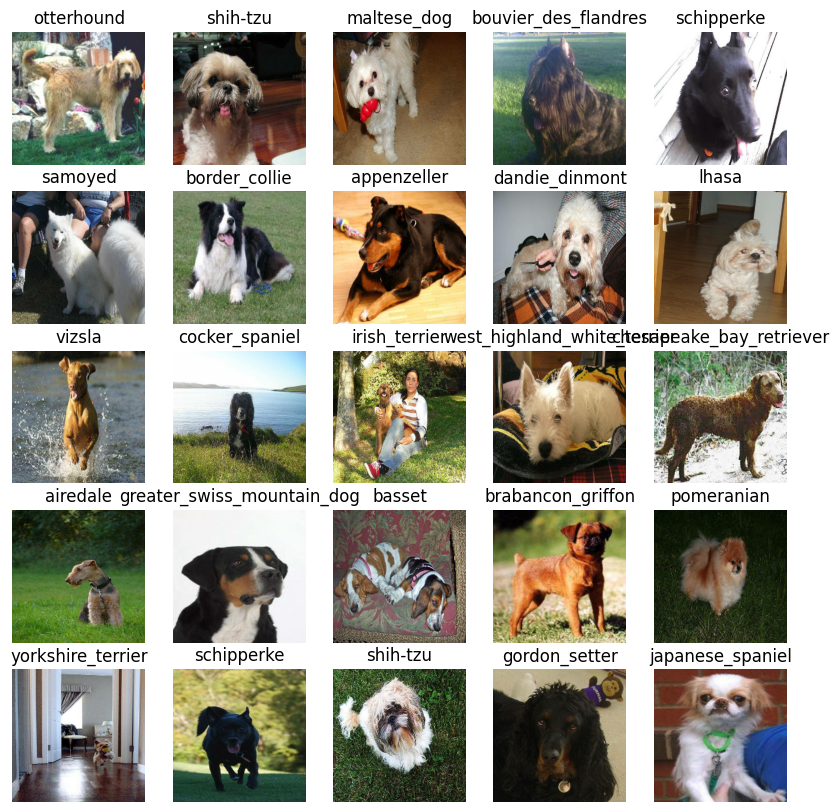

In [ ]:
# Visualize!
show_25_images(train_images, train_labels)

In [ ]:
# Visualize validation set
val_images, val_labels = next(val_data.as_numpy_iterator())

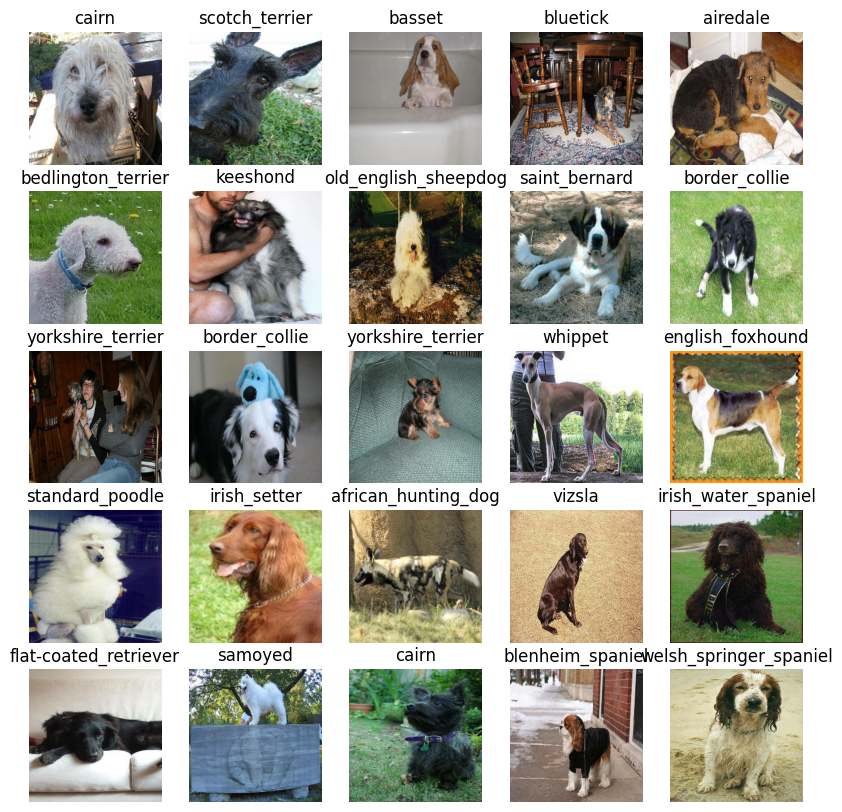

In [ ]:
show_25_images(val_images, val_labels)

## Building a model
three things:
* The input shape(our image shape, in the form of Tensors) to our model.

* The output shape(image labels, in the form of Tensors) of our model.

* The URL of the model we want to use. (OR CREATE YOUR OWN)


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
# https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1

Let's create a function which:
* Takes input shape, output shape and model we've choosen as parameters
* Defines the layers in a keras model in sequential fashion
* Compiles the model
* Builds the model
* Returns the model
* https://www.tensorflow.org/guide/keras

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with", MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, # Layer 2 (output layer)
                            activation="softmax")
      ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
* Callbacks are hepler functions which a model can use during training to do such things as:
1. save it's progress
2. check it's progress
3. stop training early if model stops improving

We'll create two callbacks:
* TensorBoard which hepls track our model's progress
* Early stopping callback

### **TensorBoard Callback**
To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with `%tensorboard` magic function.(after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard


In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Udemy_deep_learning/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### **EarlyStopping Callback**

Helps stop our model from overfitting by stopping training if certain evaluation metrics stops improving




In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, steps:10}

In [ ]:
print("GPU available" if tf.test.is_gpu_available() else "GPU Not available")

GPU available


Function that trains a model.
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it:
(i) training data
(b) validation data
(c) no. of epochs
(d) callbacks we want to use
* Return the model

In [ ]:
def train_model():
  # Create a model
  model = create_model()

  # Create new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,   # once an epoch
            callbacks=[tensorboard, early_stopping]
            )

  # Return the fitted model
  return model

In [ ]:
# Fit the model to data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 120s 4s/step - loss: 4.4427 - accuracy: 0.1300 - val_loss: 3.4097 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 3s 104ms/step - loss: 1.5766 - accuracy: 0.6787 - val_loss: 2.1697 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 3s 110ms/step - loss: 0.5594 - accuracy: 0.9375 - val_loss: 1.6646 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 3s 117ms/step - loss: 0.2504 - accuracy: 0.9850 - val_loss: 1.4731 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 3s 101ms/step - loss: 0.1464 - accuracy: 0.9962 - val_loss: 1.4071 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 3s 99ms/step - loss: 0.0992 - accuracy: 1.0000 - val_loss: 1.3614 - val_accuracy: 0.6850
Epoch 7/100
25/25 [==============================] -

In [ ]:
800/32, 200/32

(25.0, 6.25)

Our model has 100% accuracy on training set but the accuracy on validation set is 66% which is far lower hence our model is **OVERFITTING**

## Checking the TensorBoard logs
The TensorBoard magic function will access the logs directory we created to visualize its contents

In [ ]:
%tensorboard --logdir drive/MyDrive/Udemy_deep_learning/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 114ms/step


array([[8.6204065e-03, 1.2602335e-04, 1.0531187e-03, ..., 1.8664979e-04,
        8.7461485e-05, 1.2578046e-02],
       [3.6477845e-03, 1.6754998e-03, 2.2028295e-02, ..., 6.9084420e-04,
        7.9236052e-04, 3.5008093e-04],
       [2.5614658e-05, 1.6676355e-03, 1.3619101e-04, ..., 2.1702638e-04,
        4.7611215e-04, 2.9998650e-03],
       ...,
       [6.4506501e-05, 2.7670443e-05, 6.3591765e-04, ..., 2.6037991e-05,
        3.9794078e-04, 7.0119154e-04],
       [2.9042324e-03, 6.2874024e-05, 1.1020821e-04, ..., 4.0282626e-04,
        1.8333767e-05, 1.0186356e-02],
       [2.3827070e-04, 1.2681443e-05, 2.2912128e-03, ..., 3.4011162e-03,
        5.7761377e-04, 8.8651519e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(predictions[0]), len(unique_breeds)

(120, 120)

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.01379761e-05 1.86400139e-04 4.37589420e-04 1.20523102e-04
 9.58804693e-03 1.15845156e-04 1.56315591e-03 2.75642006e-03
 5.53484168e-03 6.62834123e-02 8.20888017e-05 4.35541842e-05
 2.60559283e-03 5.74590266e-03 4.37373761e-03 1.51033280e-02
 1.42565244e-04 4.36878501e-04 1.80257863e-04 6.66234235e-04
 8.18391345e-05 1.48157962e-03 3.70300440e-05 3.03318429e-05
 1.76455397e-02 8.33956656e-05 2.98086117e-04 1.48276056e-04
 3.63706058e-04 1.24660248e-04 3.00083571e-04 9.66265216e-04
 2.28389090e-05 1.39499462e-04 1.31877576e-04 2.44159397e-04
 3.53457581e-04 1.51560307e-04 2.25619369e-04 1.47608861e-01
 3.57304903e-04 2.19664696e-04 3.66356666e-03 5.65868177e-05
 1.12972164e-03 1.79771578e-05 2.88089295e-03 3.01331049e-04
 6.61528466e-05 1.02724251e-03 8.05018208e-05 2.84195499e-04
 1.81497331e-03 2.63097603e-03 2.33794824e-04 3.15995712e-04
 1.79183204e-04 5.63121575e-04 1.63610763e-04 2.21964860e-04
 5.85484013e-05 8.11490754e-04 3.75650015e-05 2.04221506e-04
 1.36554023e-04 1.180696

It would be better if we could see the image the prediction is being made on

**NOTE** Prediction probabilities are also called confidence levels



In [ ]:
# Turn prediction probabilites into their respective label
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

**NOW**
1. Unbatch the validation dataset
2. Make prediction on validation images and compare the predictions to the validation labels

In [ ]:
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_[0].shape

(224, 224, 3)

In [ ]:
labels_[0].shape

(120,)

In [ ]:
print(get_pred_label(labels[0]))
print(get_pred_label(predictions[0]))

affenpinscher
cairn


In [ ]:
# Functionize
def unbatchify(batched_dataset):
  '''
  Takes input a batched dataset containing (image, label)
  and returns unbatched images and labels
  '''
  images_ = []
  labels_ = []
  # Loop through unbatched data
  for image, label in batched_dataset.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(label)
  return images_, labels_

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:

def compare_labels(images, true_labels, predicted_labels):
    MAX_NUM = 10
    # Setup the figure
    plt.figure(figsize=(15, 2 * MAX_NUM))  # Adjust the height based on the number of images

    # Display titles at the top
    plt.subplot(MAX_NUM, 4, 1)
    plt.title("Index", fontsize=12)
    plt.axis("off")

    plt.subplot(MAX_NUM, 4, 2)
    plt.title("Image", fontsize=12)
    plt.axis("off")

    plt.subplot(MAX_NUM, 4, 3)
    plt.title("True Label", fontsize=12)
    plt.axis("off")

    plt.subplot(MAX_NUM, 4, 4)
    plt.title("Predicted Label", fontsize=12)
    plt.axis("off")


    for i in range(MAX_NUM):
        # Display index column
        ax = plt.subplot(MAX_NUM, 4, i*4 + 1)
        plt.text(0.5, 0.5, f'{i+1}.',
                 fontsize=10, ha='center',
                 va='center')
        plt.axis("off")

        # Display image column
        ax = plt.subplot(MAX_NUM, 4, i*4 + 2)
        plt.imshow(images[i])
        plt.axis("off")

        # Display true labels
        ax = plt.subplot(MAX_NUM, 4, i*4 + 3)
        true_label = unique_breeds[np.argmax(true_labels[i])]
        plt.text(0.5, 0.5, f'{true_label}',
                 fontsize=10, ha='center',
                 va='center')
        plt.axis("off")

        # Display predicted labels
        ax = plt.subplot(MAX_NUM, 4, i*4 + 4)
        pred_val = np.max(predicted_labels[i])*100
        pred_label = get_pred_label(predicted_labels[i])
        plt.text(0.5, 0.5, f'{pred_label} {pred_val:.2f}%',
                 fontsize=10, ha='center',
                 va='center')
        plt.axis("off")

    plt.show()


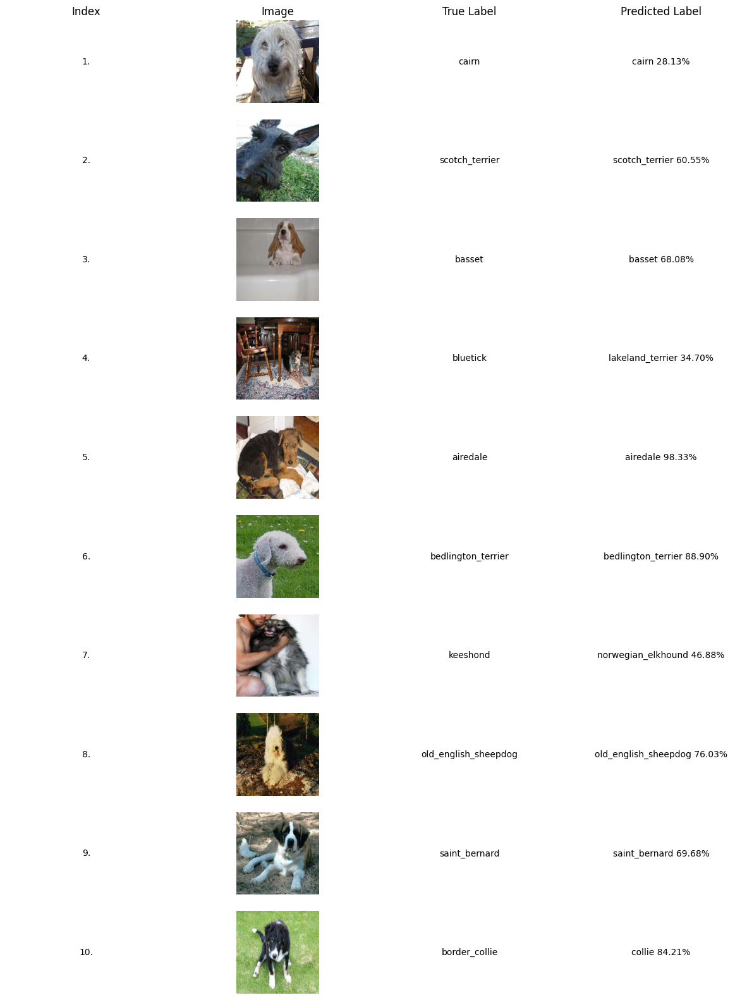

In [ ]:
compare_labels(val_images, val_labels, predictions)

Create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, it's predicted probability, then the truth label and target image on a single plot

In [ ]:
def plot_pred(prediction_probabilites, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image=prediction_probabilites[n], labels[n], images[n]

  true_label = unique_breeds[np.argmax(labels[n])]
  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color="red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)


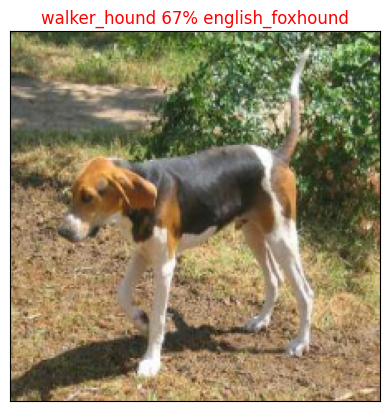

In [ ]:
plot_pred(prediction_probabilites=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Let's make another function to view our model top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10:
  * Prediction probabilites indexes
  * Prediction probabilites values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plots the top 10 highest prediction confidences along with truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  true_label = unique_breeds[np.argmax(labels[n])]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="black")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             top_10_pred_labels,
             rotation="vertical")
  # Change color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
# Top 10 highest values in ascending order
print(predictions[0][predictions[0].argsort()[-10:]])
# Top 10 highest value in descending order
print(predictions[0][predictions[0].argsort()[-10:][::-1]])

[0.02900213 0.02956369 0.04212844 0.0452693  0.05509199 0.07264082
 0.08445488 0.09062239 0.09096927 0.2813332 ]
[0.2813332  0.09096927 0.09062239 0.08445488 0.07264082 0.05509199
 0.0452693  0.04212844 0.02956369 0.02900213]


In [ ]:
predictions[0]

array([8.6204065e-03, 1.2602335e-04, 1.0531187e-03, 2.5708285e-05,
       2.2281770e-04, 1.8641082e-05, 8.4454879e-02, 7.4034568e-04,
       2.2868834e-04, 6.5516966e-04, 5.6431780e-04, 5.8586156e-04,
       2.8633900e-04, 1.9988064e-04, 9.6038694e-04, 1.0356685e-03,
       9.2863818e-05, 7.2640821e-02, 2.2702285e-05, 8.9101115e-04,
       8.7283133e-04, 6.9309637e-04, 4.1273554e-05, 1.7665264e-03,
       7.2568648e-05, 1.6957035e-04, 2.8133321e-01, 3.9275087e-04,
       4.9670599e-04, 5.8455922e-04, 2.6508764e-04, 7.9062663e-04,
       2.2164187e-03, 6.5868335e-05, 2.1740793e-04, 2.9002128e-02,
       1.8591147e-04, 3.6761625e-04, 1.1561035e-04, 1.6021827e-04,
       1.0600605e-03, 1.6474797e-04, 2.9261890e-05, 1.4709390e-03,
       3.0504636e-05, 4.0664021e-05, 7.6092932e-05, 5.1174784e-04,
       7.3607749e-05, 3.5733884e-04, 1.5324196e-04, 1.2242778e-04,
       7.2960759e-04, 1.0419832e-04, 3.9643437e-05, 1.3094774e-04,
       9.9306856e-04, 7.6299929e-03, 1.3489326e-04, 9.0622388e

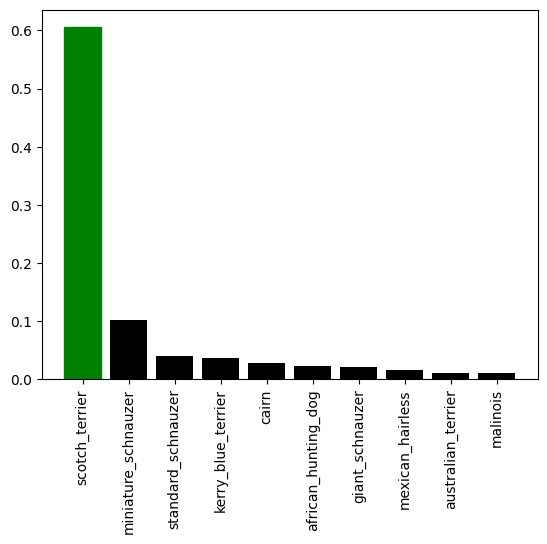

In [ ]:
plot_pred_conf(predictions, val_labels, 1)

Now let's make visulaizations for more than images

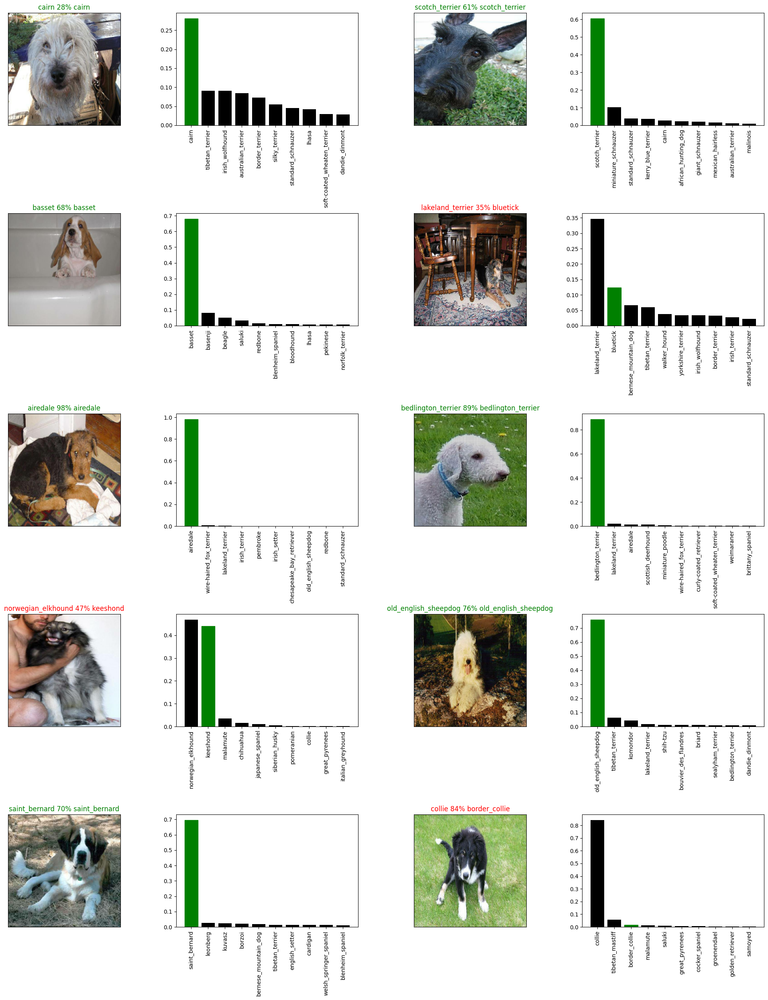

In [ ]:
i_multiplier = 0
num_rows = 5
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions,
            val_labels,
            val_images,
            i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions,
                 val_labels,
                 i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Confusion matrix
Create one with models predictions and true labels

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Save a given model in a models directory and appends a suffix (string).
  '''
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Udemy_deep_learning/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to : {model_path}")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a model
def load_model(model_path):
  '''
  Load a saved model from a specified path.
  '''
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Making sure the above functions work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Udemy_deep_learning/models/20231211-13581702303102-1000-images-mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Udemy_deep_learning/models/20231211-13581702303102-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model("drive/MyDrive/Udemy_deep_learning/models/20231211-13581702303102-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Udemy_deep_learning/models/20231211-13581702303102-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 129ms/step - loss: 1.2857 - accuracy: 0.6750


[1.285703420639038, 0.675000011920929]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 3s 186ms/step - loss: 1.2857 - accuracy: 0.6750


[1.285703420639038, 0.675000011920929]

## Train model on all data



In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with full data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


Running the following cell is gonna take a long time for the first epoch

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 106ms/step - loss: 1.3579 - accuracy: 0.6631
Epoch 2/100
320/320 [==============================] - 30s 93ms/step - loss: 0.4020 - accuracy: 0.8803
Epoch 3/100
320/320 [==============================] - 28s 88ms/step - loss: 0.2367 - accuracy: 0.9374
Epoch 4/100
320/320 [==============================] - 30s 92ms/step - loss: 0.1545 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 29s 92ms/step - loss: 0.1070 - accuracy: 0.9774
Epoch 6/100
320/320 [==============================] - 30s 92ms/step - loss: 0.0771 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0587 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 28s 86ms/step - loss: 0.0475 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0369 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 29s 92ms/step - 

In [ ]:
save_model(full_model, suffix="10022-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Udemy_deep_learning/models/20231211-14281702304922-10022-images-mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Udemy_deep_learning/models/20231211-14281702304922-10022-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/MyDrive/Udemy_deep_learning/models/20231211-14281702304922-10022-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Udemy_deep_learning/models/20231211-14281702304922-10022-images-mobilenetv2-Adam.h5


## Making predictions on test data
Since our model has been trained on images in the form of tensor batches, we need test data in the same form

`create_data_batches()` can take a list of filenames as input and convert them into Tensor batches

To make predictions on test data we will:
* Get the image filenames
* Convert the filenames into test data baches using `create_data_batches()` and setting the `test_data` parameter to `True` (since test data doesn't have labels)
* Make a predictions array by passing the test batches to `predict()` method called on our model

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Udemy_deep_learning/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Udemy_deep_learning/test/e2844bf76c0ddeae02277d76c31e41f5.jpg',
 'drive/MyDrive/Udemy_deep_learning/test/e646ac89e0832502f9a726c72773cfcc.jpg',
 'drive/MyDrive/Udemy_deep_learning/test/e5ded7a736b3336729463af8d74a09c9.jpg',
 'drive/MyDrive/Udemy_deep_learning/test/e0295b9b1bee725d52d74f9af84092cf.jpg',
 'drive/MyDrive/Udemy_deep_learning/test/df645ae75554d4d7130bfa1b72be53ce.jpg',
 'drive/MyDrive/Udemy_deep_learning/test/dd2c0c44f98af0cf223572a1aa189779.jpg',
 'drive/MyDrive/Udemy_deep_learning/test/e7ed96b272013c6de9505a753816ce75.jpg',
 'drive/MyDrive/Udemy_deep_learning/test/deb66780609abfef7f5048df02149839.jpg',
 'drive/MyDrive/Udemy_deep_learning/test/e6a0eeb3e82e14eb812d9ef22383ec11.jpg',
 'drive/MyDrive/Udemy_deep_learning/test/e61cd2626c01dd00117eca55fb099f5d.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Convert filenames into data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Calling `predict()` on our full model and passing it the test data batch will take a long time to run


In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1406s 4s/step


In [ ]:
# 10357/32

323.65625

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
# Save predictions (NumPy array) to csv file
df = pd.DataFrame(test_predictions)

In [ ]:
df.to_csv("drive/MyDrive/Udemy_deep_learning/preds_array.csv", index=True, header=False)

In [ ]:
loaded_df = pd.read_csv("drive/MyDrive/Udemy_deep_learning/preds_array.csv")

In [ ]:
loaded_df

,0,8.669625e-12,8.4500996e-14,1.6054997e-13,9.553176e-15,6.307936e-10,9.565257e-09,4.1769045e-12,3.254539e-09,3.8690575e-09,...,1.5516073e-06,0.0002670462,7.783884e-14,1.7875448e-14,5.682218e-09,2.4178829e-11,8.0331656e-13,6.715276e-06,1.1132475e-09,1.6685142e-08
0,1,2.479981e-05,2.521751e-06,2.500858e-07,4.378980e-10,7.296374e-04,1.011015e-06,2.741601e-06,1.628861e-05,6.266615e-08,...,2.769909e-03,3.839710e-06,7.665583e-07,4.311644e-05,3.331923e-07,4.170843e-07,9.567753e-05,5.516065e-05,6.987455e-06,2.939798e-05
1,2,7.280326e-11,7.078467e-11,1.883556e-06,3.835793e-09,3.448401e-11,8.496398e-05,1.617657e-08,2.895513e-09,1.835398e-11,...,1.514568e-10,1.605995e-06,4.474179e-11,2.545774e-10,5.461471e-09,4.748181e-11,1.606447e-08,8.947907e-10,6.250188e-09,1.159577e-08
2,3,4.116081e-09,2.117759e-08,7.504998e-09,1.095779e-07,1.237848e-09,7.671290e-09,7.385972e-08,1.578502e-12,6.249652e-11,...,6.115963e-11,2.081223e-09,4.569046e-12,1.118707e-06,2.553239e-06,6.710080e-11,3.019948e-09,3.353642e-06,9.246616e-06,1.824499e-08
3,4,2.724764e-07,1.945859e-08,2.003890e-08,1.058279e-06,1.188265e-08,3.252540e-09,6.509851e-12,5.977550e-11,2.374629e-10,...,2.344419e-09,6.257890e-10,3.838143e-08,4.436456e-08,1.286931e-07,6.385191e-09,6.673848e-11,1.195991e-07,4.884377e-11,8.056510e-11
4,5,1.828707e-06,1.371065e-10,4.137311e-09,7.065699e-09,4.352654e-08,1.009184e-09,1.112693e-09,1.760521e-08,1.361384e-10,...,7.604978e-09,7.654548e-08,8.711093e-08,6.020613e-09,8.142347e-09,8.091401e-08,2.043583e-09,6.473387e-08,1.465006e-09,1.115937e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10351,10352,2.616057e-11,3.822485e-05,2.241851e-01,9.229371e-08,6.257266e-09,1.023213e-10,1.539928e-08,2.649127e-11,4.605914e-09,...,1.297792e-10,1.508982e-13,4.212385e-10,1.230884e-08,5.266943e-10,2.188092e-07,7.502588e-10,1.243911e-05,2.480737e-08,8.001466e-10
10352,10353,1.642154e-11,1.515024e-11,9.227978e-14,1.259367e-07,7.889474e-08,1.402350e-10,1.787702e-09,1.100776e-11,1.999854e-11,...,1.787006e-10,1.023751e-06,5.425871e-11,4.418950e-11,1.109459e-13,1.406303e-11,1.411250e-11,6.839222e-06,3.513052e-09,2.149347e-08
10353,10354,1.259133e-04,9.665025e-10,1.026107e-09,1.295343e-06,1.446493e-07,3.551448e-11,1.648434e-04,1.253557e-11,2.714830e-09,...,4.413460e-09,1.110282e-09,1.263455e-09,2.267825e-08,6.978111e-11,1.831047e-10,1.175786e-10,2.693319e-08,6.792799e-12,6.719212e-07
10354,10355,7.005463e-13,9.707830e-13,1.897943e-09,5.771062e-09,5.648615e-08,2.112061e-09,7.512990e-08,2.138376e-09,1.177259e-11,...,2.230597e-10,1.699785e-08,2.755413e-04,3.753657e-08,2.392492e-07,2.591106e-12,2.089717e-10,1.411605e-09,2.780758e-08,3.008325e-10


In [ ]:
loaded_df_arr=loaded_df.to_numpy()

In [ ]:
loaded_df_arr

array([[1.0000000e+00, 2.4799814e-05, 2.5217505e-06, ..., 5.5160654e-05,
        6.9874554e-06, 2.9397980e-05],
       [2.0000000e+00, 7.2803256e-11, 7.0784670e-11, ..., 8.9479070e-10,
        6.2501884e-09, 1.1595769e-08],
       [3.0000000e+00, 4.1160810e-09, 2.1177595e-08, ..., 3.3536423e-06,
        9.2466160e-06, 1.8244988e-08],
       ...,
       [1.0354000e+04, 1.2591328e-04, 9.6650250e-10, ..., 2.6933192e-08,
        6.7927990e-12, 6.7192116e-07],
       [1.0355000e+04, 7.0054634e-13, 9.7078300e-13, ..., 1.4116050e-09,
        2.7807580e-08, 3.0083253e-10],
       [1.0356000e+04, 1.2422571e-09, 4.2706110e-13, ..., 4.9398490e-14,
        3.2990310e-11, 2.0464770e-12]])